<a href="https://colab.research.google.com/github/ravishankarramakrishnan/Deep_Learning_Practice/blob/master/Explainable_AI_CNN_%26_Scene_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

AI Explainability:

Why does the AI Make this kind of Prediction. Done by using GRAD - CAM (Gradient Weighted Class Activation Mapping)

Data: https://www.microsoft.com/en-us/ai/ai-for-earth

The Goal is to perform Scenary Classification from Images

In [35]:
# Importing the Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import os
import PIL

In [36]:
# Mounting the Drive So as to share the Data
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# os.listdir returns the list of files in the folder, in this case image class names
for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train'):
    print(i)

mountain
buildings
forest
street
glacier
sea


In [4]:
# POC on How to show all images present in a Directory

train_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train', 'mountain'))
train_class[:10]

['17577.jpg',
 '1788.jpg',
 '18556.jpg',
 '16533.jpg',
 '15835.jpg',
 '16590.jpg',
 '15812.jpg',
 '15991.jpg',
 '19691.jpg',
 '1962.jpg']

In [5]:
# Get the number of images in training, validation and test dataset

train = []
test = []

# os.listdir returns the list of files in the folder, in this case image class names - Both seg_train and seg_test has same Folders and images inside. So we can use any of them
for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train'): # I is the Name of Different Folders
    # Path for Filepath + ImageName
    train_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train', i)) # You List all in that Directory
    # Extend Adds all data present on Folder on to the List
    train.extend(train_class)
    test_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test', i))
    test.extend(test_class)

print(f"The Number of Train Images are: {len(train)} and the Number of Test Images are: {len(test)}")

The Number of Train Images are: 14034 and the Number of Test Images are: 3000


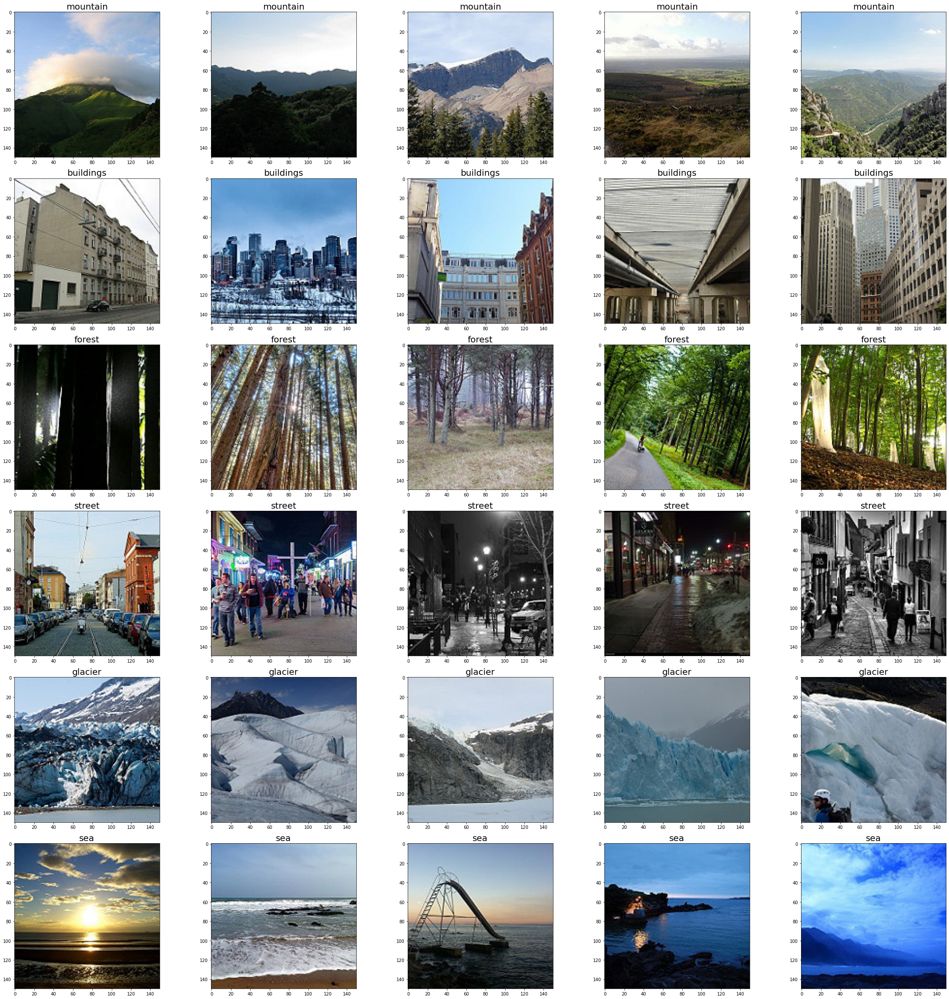

In [6]:
# Data Exploration and Visualisation

# Visualising Images in the Dataset

fig, ax = plt.subplots(6,5, figsize= (32, 32)) # 6 Folders, 5 Random Images
count = 0

for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train'):
    # Get List of Images of a Particular Class (Folder) via listdir
    train_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train', i))
    # Plot 5 Sample Images from Class
    for j in range(5):
        # Read an Image and display it
        img = os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train', i, train_class[j])
        # Open and Show the Image via imshow function. PIL -> It is a Package to deal with Images
        img = PIL.Image.open(img)
        # Show on Axes
        ax[count][j].imshow(img) # Row 0 and Column j (Ranging from 0 - 5)
        # Set the Title Corresponding to Image
        ax[count][j].set_title(i, fontsize= 20)

    # Increase the counter 
    count+= 1

fig.tight_layout();


In [7]:
# Get the Number of Images in Each Class in Training Set

No_img_per_class = []
Class_name= []

for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train'):
    train_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train', i))
    No_img_per_class.append(len(train_class))
    Class_name.append(i)

    print(f"The number of Training Set Images in {i} is: {len(train_class)}")

The number of Training Set Images in mountain is: 2512
The number of Training Set Images in buildings is: 2191
The number of Training Set Images in forest is: 2271
The number of Training Set Images in street is: 2382
The number of Training Set Images in glacier is: 2404
The number of Training Set Images in sea is: 2274


In [8]:
# Identify the Type of Data

print("The Class Names in List are: ", Class_name)
print("The No of Images in List are: ", No_img_per_class)

The Class Names in List are:  ['mountain', 'buildings', 'forest', 'street', 'glacier', 'sea']
The No of Images in List are:  [2512, 2191, 2271, 2382, 2404, 2274]


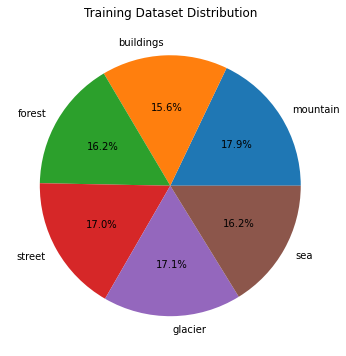

In [9]:
# Visualise a Pie Chart for Training Data Set

fig, ax = plt.subplots(figsize= (8,6))
ax.pie(No_img_per_class, labels= Class_name, autopct= "%1.1f%%"); # autoPCT automatically converts data to Percentage
plt.title("Training Dataset Distribution")
plt.show();

In [10]:
# # Get the Number of Images in Each Class in Test Set

No_img_per_class = []
Class_name= []

for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test'):
    test_class = os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test', i))
    No_img_per_class.append(len(test_class))
    Class_name.append(i)

    print(f"The number of Test Set Images in {i} is: {len(test_class)}")

The number of Test Set Images in glacier is: 553
The number of Test Set Images in forest is: 474
The number of Test Set Images in buildings is: 437
The number of Test Set Images in mountain is: 525
The number of Test Set Images in street is: 501
The number of Test Set Images in sea is: 510


In [11]:
# Identify the Type of Data

print("The Class Names in List are: ", Class_name)
print("The No of Images in List are: ", No_img_per_class)

The Class Names in List are:  ['glacier', 'forest', 'buildings', 'mountain', 'street', 'sea']
The No of Images in List are:  [553, 474, 437, 525, 501, 510]


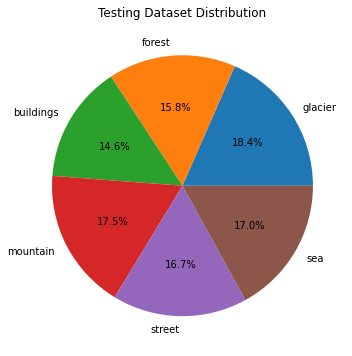

In [12]:
# Visualise a Pie Chart for Testing Data Set

fig, ax = plt.subplots(figsize= (8,6))
ax.pie(No_img_per_class, labels= Class_name, autopct= "%1.1f%%"); # autoPCT automatically converts data to Percentage
plt.title("Testing Dataset Distribution")
plt.show();

In [13]:
# Performing Data Augmentation and Creating a Data Generator - Creating Runtime Augmentation for Training and Test Set

# For Training DataGenerator we add., Normalisation, Shear Angle, Zooming Range, Horizontal Flip etc. -> It improves Model Generalisation Capablity

train_datagen = ImageDataGenerator(rescale= 1./255,
                                   zoom_range= 0.2,
                                   validation_split= 0.15,
                                   horizontal_flip= True)

# For Testing Dataset, we only add Normalisation - Rescale means Normalisation (Bringing all to values between 0 and 1)

test_datagen = ImageDataGenerator(rescale= 1./255)

In [14]:
# Creating Data Generator For Training, Validation and Test Data

# Train Generator
train_generator = train_datagen.flow_from_directory(
    directory= "/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train",
    target_size= (256, 256),
    batch_size= 32,
    class_mode= "categorical", # As we have More than 2 Classes
    subset= "training")

# Validation Generator
validation_generator = train_datagen.flow_from_directory(
    directory= "/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_train",
    target_size= (256, 256),
    batch_size= 32,
    class_mode= "categorical", # As we have More than 2 Classes
    subset= "validation")

# Test Generator
test_generator = test_datagen.flow_from_directory(
    directory= "/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test",
    target_size= (256, 256),
    batch_size= 32,
    class_mode= "categorical") # As we have More than 2 Classes, and No Subset as entire Data will be allocated for Testing

Found 11932 images belonging to 6 classes.
Found 2102 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [23]:
# Using ResNets and CNN

# Building a Res-Net Model -> Res Block (Convolution and Identity Block)

def res_block(X, filter, stage):

    """ 
    This Function Performs Operations
    on Residual Blocks
    """

    # Create Convolution Block (Main Path and Short Path)
    X_copy = X
    f1, f2, f3 = filter

    # Main Path
    X = Conv2D(f1, (1,1), strides= (1,1), name= "res_"+ str(stage) + "_conv_a", kernel_initializer= glorot_uniform(seed = 0))(X)
    X = MaxPool2D((2,2)) (X)
    X = BatchNormalization(axis= 3, name= "bn_"+ str(stage) +"_conv_a") (X)
    X = Activation('relu') (X)

    X = Conv2D(f2, kernel_size= (3,3), strides= (1,1), padding= "same",name= "res_"+ str(stage) + "_conv_b", kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis= 3, name= "bn_"+ str(stage) +"_conv_b") (X)
    X = Activation('relu') (X)

    X = Conv2D(f3, kernel_size= (1,1), strides= (1,1), name= "res_"+ str(stage) + "_conv_c", kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis= 3, name= "bn_"+ str(stage) +"_conv_c") (X)

    # Take Care of Assigning Right Kernel Size, they may bring Errors

    # Short Path (Applied Onle for the Base Input)
    X_copy = Conv2D(f3, kernel_size= (1,1), strides= (1,1), name ='res_'+str(stage)+'_conv_copy', kernel_initializer= glorot_uniform(seed = 0)) (X_copy)
    X_copy = MaxPool2D((2,2)) (X_copy)
    X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy') (X_copy)

    # Adding f(x) + x
    X = Add()([X, X_copy])
    X = Activation('relu') (X)

    # --------------------------------------------------------------------------
    # Create Identity Block 1 - Only Main Path, No Short Path

    X_copy = X

    # Main Path
    X = Conv2D(f1, (1,1), strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

    # ADD
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    # Identity Block 2
    X_copy = X

    # Main Path
    X = Conv2D(f1, (1,1), strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

    # ADD
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    return X



In [26]:
# Build the RESNET - 18 Model

# Get the Input Shape

input_shape = (256, 256, 3) # 3 is Filters R,G,B

# Input Tensor Shape
X_input = Input(input_shape)

# Add Zero Padding
X = ZeroPadding2D((3,3)) (X_input)

# Stage 1
X = Conv2D(64, kernel_size= (7,7), strides= (2,2), name= "conv1", kernel_initializer= glorot_uniform(seed = 0)) (X)
X = BatchNormalization(axis= 3, name= "bn_conv1") (X)
X = Activation('relu') (X)
X = MaxPooling2D((3,3), strides= (2,2)) (X) # Remove kernel_size if Problem Comes

# Stage 2
X = res_block(X, filter= [64,64,256], stage= 2)

# Stage 3
X = res_block(X, filter= [128,128,512], stage= 3)

# Stage 4
X = res_block(X, filter= [256,256,1024], stage= 4)

# Stage 5
X = res_block(X, filter= [512,512,2048], stage= 5)


# Average Pooling
X = AveragePooling2D((2,2), name= "Average_Pooling") (X) # No Space must come in the Name String

# Final Layer - Flatten
X = Flatten() (X)
X = Dropout(0.2) (X) # Helps Avoid Neurons developing Co-Dependencies among one another, Helps Model Generalize better and Improve Performance
X = Dense(6, activation= "softmax", name= "Dense_Final", kernel_initializer= glorot_uniform(seed = 0)) (X)

In [27]:
# Initiate the Model

model = Model(inputs= X_input, outputs= X, name= "Resnet18")
model.summary()

Model: "Resnet18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_5 (ZeroPadding2D (None, 262, 262, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 128, 64) 9472        zero_padding2d_5[0][0]           
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 128, 128, 64) 256         conv1[0][0]                      
___________________________________________________________________________________________

In [28]:
# Compiling and Training the Deep Learning Model

model.compile(optimizer= 'adam', loss= 'categorical_crossentropy', metrics= ['accuracy']) # categorical_crossentropy as we have 6 classes

# Add Early Stopping to Ensure that the Model is not Overfitting the Training Data, and we monitor the Validation Loss
earlystopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=15, verbose=1, mode='min') # If it doesnt Increase for 15 epochs, then stop training

# Save the Model with Lower Validation Loss
path= "/content/drive/My Drive/Projects/Scene Classification & Explainable AI/weights/weights_1.hdf5"
checkpoints = ModelCheckpoint(filepath= path, monitor='val_loss', verbose=1, save_best_only=True)

In [31]:
print(f"The Total Values in Training Generator is {train_generator.n} and Validation Generator is {validation_generator.n}")

The Total Values in Training Generator is 11932 and Validation Generator is 2102


In [33]:
# Start the Training
history= model.fit_generator(train_generator, steps_per_epoch= train_generator.n // 32,
                             epochs= 1, validation_data= validation_generator,
                             validation_steps= validation_generator.n // 32, callbacks=[checkpoints , earlystopping])

Instructions for updating:
Please use Model.fit, which supports generators.
372/372 [==============================] - ETA: 0s - loss: 1.2664 - accuracy: 0.5929 
Epoch 00001: val_loss improved from inf to 1.72955, saving model to /content/drive/My Drive/Projects/Scene Classification & Explainable AI/weights/weights.hdf5
372/372 [==============================] - 6585s 18s/step - loss: 1.2664 - accuracy: 0.5929 - val_loss: 1.7295 - val_accuracy: 0.4274


In [41]:
# Take the Pretrained Model and Retrain it

model.load_weights('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/weights/weights.hdf5')

In [42]:
# Start the Training
history= model.fit_generator(train_generator, steps_per_epoch= train_generator.n // 32,
                             epochs= 10, validation_data= validation_generator,
                             validation_steps= validation_generator.n // 32, callbacks=[checkpoints , earlystopping])

Epoch 1/10
372/372 [==============================] - ETA: 0s - loss: 0.3589 - accuracy: 0.8718
Epoch 00001: val_loss improved from 0.52657 to 0.44452, saving model to /content/drive/My Drive/Projects/Scene Classification & Explainable AI/weights/weights.hdf5
372/372 [==============================] - 280s 754ms/step - loss: 0.3589 - accuracy: 0.8718 - val_loss: 0.4445 - val_accuracy: 0.8313
Epoch 2/10
372/372 [==============================] - ETA: 0s - loss: 0.3412 - accuracy: 0.8813
Epoch 00002: val_loss did not improve from 0.44452
372/372 [==============================] - 276s 741ms/step - loss: 0.3412 - accuracy: 0.8813 - val_loss: 0.7285 - val_accuracy: 0.7433
Epoch 3/10
372/372 [==============================] - ETA: 0s - loss: 0.3133 - accuracy: 0.8878
Epoch 00003: val_loss did not improve from 0.44452
372/372 [==============================] - 271s 729ms/step - loss: 0.3133 - accuracy: 0.8878 - val_loss: 0.6185 - val_accuracy: 0.7731
Epoch 4/10
372/372 [=====================

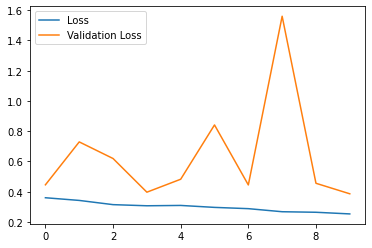

In [43]:
# Plotting the Loss for each Iteration

import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend();


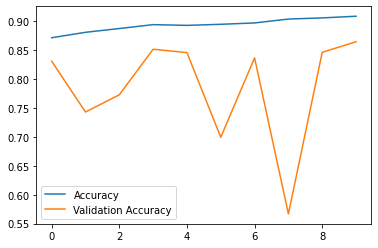

In [44]:
# Plotting the Loss for each Iteration

plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend();
plt.show();

# The History Plots are different as the Model was retrained for Several number of times

In [45]:
# Assess the Performance of the Model

evaluate = model.evaluate_generator(test_generator, steps= test_generator.n // 32, verbose= 1)

Instructions for updating:
Please use Model.evaluate, which supports generators.
93/93 [==============================] - 1422s 15s/step - loss: 0.3534 - accuracy: 0.8723


In [46]:
# Assign the Label Names to the Corresponding Indexes
labels = {0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}

In [47]:
# Loading the Images and their Predictions

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
#import cv2

# Assessing the Trained Model
prediction = []
original = []
image = []
count = 0

# Loop through to predict

for i in os.listdir('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test'): # Get the Folder
    for item in os.listdir(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test', i)): # Get all files in relevant folder
        # Code for Opening the Image
        img = PIL.Image.open(os.path.join('/content/drive/My Drive/Projects/Scene Classification & Explainable AI/seg_test', i, item)) # Open Particular file in a relevant folder
        # Resize Image to 256 * 256
        img = img.resize((256, 256))
        # Appending Image to Image list
        image.append(img)
        # Convert image to array for prediction
        img = np.asarray(img, dtype= np.float32)
        # Normalizing the Image
        img = img / 255
        # Reshape image to 4D Array [Batch Format]
        img = img.reshape(-1, 256, 256, 3) # -1 is Axis 0; 256 * 256 * 3 is because we have a coloured scaled image
        # Making Predictions of the Model
        predict = model.predict(img)
        # Get Index corresponding to Highest value in Predictions
        predict = np.argmax(predict)
        # Append Predicted class to List
        prediction.append(labels[predict]) # To get the Label of the Predicted Index
        # Append the Original class to List
        original.append(i)


In [54]:
# Get the Test Accuracy

score = accuracy_score(original, prediction)
print("The Test Accuracy is: {}".format(round(score, 2)))

The Test Accuracy is: 0.87


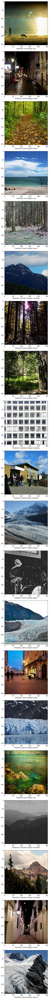

In [50]:
# Visualising the Results

import random
fig = plt.figure(figsize= (100, 100))
for i in range(20):
    j = random.randint(0, len(image)) # J is a Random Index for which we find actual, predicted and the Image
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] + " Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show();

In [60]:
# Classification Report

print("The Classification Report for Our Model is: \n\n", classification_report(np.asarray(original), np.asarray(prediction))) # We can also use classification_report(original, predicted)
# F1 Score is Harmonic Mean between Precision and Recall

The Classification Report for Our Model is: 

               precision    recall  f1-score   support

   buildings       0.90      0.86      0.88       437
      forest       0.99      0.95      0.97       474
     glacier       0.84      0.80      0.82       553
    mountain       0.79      0.89      0.83       525
         sea       0.95      0.81      0.87       510
      street       0.83      0.95      0.89       501

    accuracy                           0.87      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.88      0.87      0.87      3000



The Confusion Matrix for Our Model is: 

 [[377   0   3   3   2  52]
 [  6 449   2   4   0  13]
 [  4   1 444  82  13   9]
 [  3   2  47 465   6   2]
 [  9   0  35  35 413  18]
 [ 21   2   0   2   1 475]]


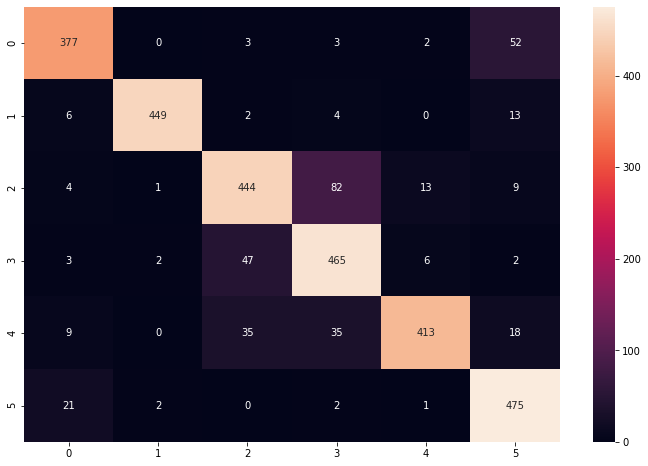

In [65]:
# Confusion Matrix

print("The Confusion Matrix for Our Model is: \n\n", confusion_matrix(original, prediction))

# Plot the Heatmap
plt.figure(figsize= (12, 8))
sns.heatmap(confusion_matrix(original, prediction), annot= True, fmt="d");

## GRAD-CAM and Explainable AI

GRAD-CAM is Gradient Weighted Class Activation Mapping, helps in Visualising the Regions of inputs that contributes towards making prediction by the Model.

It is Nothing But you SuperImpose a Heatmap to the Model to identify which location is adding more weightage to the Outputs. (Done using Gradient Descent and Backpropagation)

In [72]:
# Visualising Activation Maps through GradCam

def grad_cam(img):
    # Convert Image to Array of Float32
    img = np.asarray(img, dtype= np.float32)
    # Reshape the Image to 4D Bunch
    img = img.reshape(-1, 256, 256, 3) # -1 is Axis 0 , the Remaining are coloured image
    img_scaled = img / 255
    
    # Name of Average Pooling and Dense Layer
    classification_layers = ['Average_Pooling', 'Dense_Final'] # As we assigned Names while building the RESNET Architecture. Dense_final is the one that Predicts the Output

    # Last Convolution Layer in Model
    final_conv = model.get_layer("res_5_identity_2_c") # As we describe in the Model Architecture

    # Create a Model with Original Model as Input and Last conv_layer as Output
    final_conv_model = keras.Model(model.inputs, final_conv.output)

    # Create Input for Classification Layer, which is output of Last_conv_layer. O/P of conv_layer is of the shape (1,3,3,2048)
    # Since Classification Input needs the Feature as Input, we ignore batch dimension
    classification_input = keras.Input(shape= final_conv.output.shape[1:])

    # We iterate through Classification Layer to get to final layer & Append the Layer as Output Layer to the Classification Model
    temp = classification_input

    for layer in classification_layers:
        temp = model.get_layer(layer) (temp)
    
    classification_model = keras.Model(classification_input, temp)

    # We use Gradient Tape to Monitor the 'final_conv_output' and retreive the Gradients corresponding to Predicted Class
    with tf.GradientTape() as tape:
        # Pass Image through Base Model and get Feature Maps
        final_conv_output = final_conv_model(img_scaled) # It is the Initial/First Half of the Model

        # Assign Gradient Tape to Monitor the conv_output
        tape.watch(final_conv_output)

        # Pass Feature Map through Classification Model & get Argmax index of the Predicted Class & Use the Index to get value produced by final layer for the Class
        prediction = classification_model(final_conv_output) # It is the Second Half of the Model
        predicted_class = tf.argmax(prediction[0][0][0]) # Get Class that has Highest Prediction Value
        predicted_class_value = prediction[:,:,:, predicted_class]

    # Heart of the GRAD-CAM (Derievative of Outputs with respect to its Activations)
    # Get the Gradient Corresponding to Predicted Class based on Feature Maps having shape (1,3,3,2048)
    gradient = tape.gradient(predicted_class_value, final_conv_output)

    # As we need Feature Values for 2048, we reduce other Dimensions
    gradient_channels = tf.reduce_mean(gradient, axis= (0,1,2))

    # We then convert Feature Maps produced by Last conv Layer (1,6,6,1536) to (6,6,1536)
    final_conv_output = final_conv_output.numpy()[0]
    gradient_channels = gradient_channels.numpy()

    # We Multiply the Filters in Feature Maps produced by final_conv_layer by filter values that are used to get the predicted class. 
    # By Doing this, we increase the value of areas that helped in making the predictions and lower the value of areas that didn't contribute towards final predictions

    for i in range(gradient_channels.shape[-1]):
        final_conv_output[:,:, i] *= gradient_channels[i]

    # We take Mean across the channels to get the Feature Maps
    heatmap = np.mean(final_conv_output, axis= -1)

    # Normalize Heatmap between 0 - 1 to Visualise it
    heatmap_normalized = np.maximum(heatmap, 0) / np.max(heatmap)

    # Rescaling and Converting the Type to int
    heatmap = np.uint8(255 * heatmap_normalized)

    # Create the ColorMap
    color_map = plt.cm.get_cmap('jet')

    # Get only rb features from heatmap
    color_map = color_map(np.arange(256))[:,:3]
    heatmap = color_map[heatmap]

    # Convert Array to Image, Resize the Image, then convert to Array
    heatmap = keras.preprocessing.image.array_to_img(heatmap)
    heatmap = heatmap.resize((256, 256))
    heatmap = np.asarray(heatmap, dtype= np.float32)

    # Add Heatmap on top of Original Image - SuperImpose to get the weighted image
    final_img = heatmap * 0.4 + img[0]
    final_img = keras.preprocessing.image.array_to_img(final_img)

    return final_img, heatmap_normalized

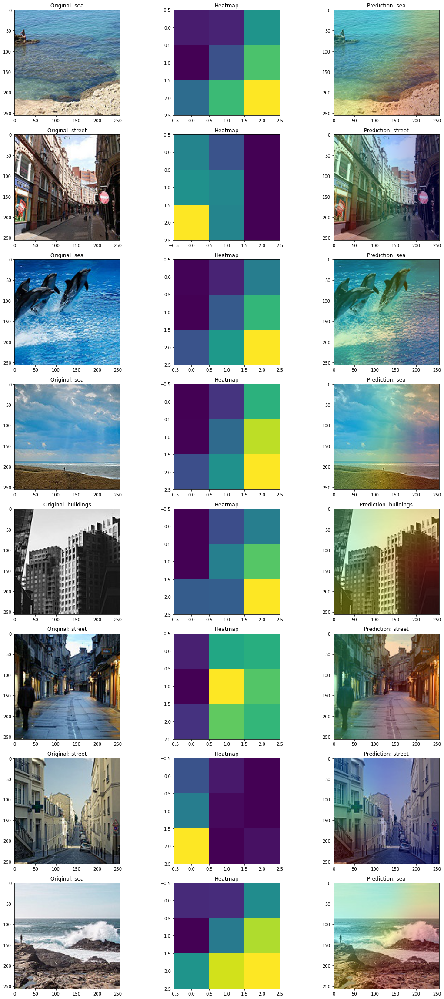

In [77]:
# Visualize the Image in the Dataset

import random
fig, axs = plt.subplots(8, 3, figsize= (16, 32))
count = 0
for i in range(8):
    i = random.randint(0, len(image))
    gradcam, heatmap = grad_cam(image[i])
    axs[count][0].title.set_text("Original: " + original[i])
    axs[count][0].imshow(image[i])
    axs[count][1].title.set_text("Heatmap")
    axs[count][1].imshow(heatmap)
    axs[count][2].title.set_text("Prediction: " + prediction[i])
    axs[count][2].imshow(gradcam)

    count += 1

fig.tight_layout()
plt.show();

# The Yellow is what the Primary Area of Focus is for the Model